# Computational Social Science Project #2 

*Group number:* 6

*Group members:* Anthony Gomez, Luyi Jian, Rachel Ross

*Semester:* Fall 2021


Below we fill in some of the code you might use to answer some of the questions. Here are some additional resources for when you get stuck:
* Code and documentation provided in the course notebooks  
* [Markdown cheatsheet](https://github.com/adam-p/markdown-here/wiki/Markdown-Cheatsheet) to help with formatting the Jupyter notebook
* Try Googling any errors you get and consult Stack Overflow, etc. Someone has probably had your question before!
* Send KQ a pull request on GitHub flagging the syntax that's tripping you up 

## 1. Introduction/Setup

#### a) Import relevant libraries
Add the other libraries you need for your code below and/or as you go. 

In [72]:
# import libraries you might need here 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import datetime as dt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

sns.set_style("darkgrid")

# use random seed for consistent results 
np.random.seed(273)

#### b) Read in and inspect data frame 
Read in the data frame and look at some of its attributes. 

In [73]:
diabetes = pd.read_csv('Diabetes with Population Info by County 2017.csv', #I think we can just list the file name provided it is in the same repo as our python code.
                       #CountyFips needs to be a string so leading 0 isn't dropped (this is only if you want to make choropleth map): 
                       dtype={"CountyFIPS": str}) 

In [74]:
# look at the dimensions of the diabetes data frame
print('shape: ', diabetes.shape) 

shape:  (3220, 95)


In [75]:
pd.set_option('display.max_rows', 100) # tells pandas how many rows to display when printing so results don't get truncated

# look at the data types for each column in diabetes df 
print('data types:', diabetes.dtypes)

data types: County                                                                                                                                                   object
State                                                                                                                                                    object
CountyFIPS                                                                                                                                               object
Diabetes_Number                                                                                                                                          object
Obesity_Number                                                                                                                                           object
Physical_Inactivity_Number                                                                                                                               object
sex and age_total population

Immediately, we see that some of the features that should be numeric (e.g., Diabetes_Number, Obesity_Number,  and Physical_Inactivity_Number) are not. We can check to see what the non-numeric values are in a column where we are expecting numeric information with a combination of `str.isnumeric()` and `unique()`.

In [76]:
# Return rows where the column "Diabetes_Number" is non-numeric and get the unique values of these rows
# the "~" below in front of diabetes negates the str.isnumeric() so it only takes non-numeric values
print(diabetes[~diabetes['Diabetes_Number'].str.isnumeric()]['Diabetes_Number'].unique()) 

['Suppressed']


In [77]:
# Now do the same as above, but for "Obesity_Number" :
print(diabetes[~diabetes['Obesity_Number'].str.isnumeric()]['Obesity_Number'].unique()) 

['No Data']


In [78]:
diabetes.head(3)

,County,State,CountyFIPS,Diabetes_Number,Obesity_Number,Physical_Inactivity_Number,sex and age_total population_65 years and over_sex ratio (males per 100 females),race_total population,race_total population_one race,race_total population_two or more races,race_total population_one race_1,race_total population_one race_white,race_total population_one race_black or african american,race_total population_one race_american indian and alaska native,race_total population_one race_american indian and alaska native_cherokee tribal grouping,race_total population_one race_american indian and alaska native_chippewa tribal grouping,race_total population_one race_american indian and alaska native_navajo tribal grouping,race_total population_one race_american indian and alaska native_sioux tribal grouping,race_total population_one race_asian,race_total population_one race_asian_asian indian,race_total population_one race_asian_chinese,race_total population_one race_asian_filipino,race_total population_one race_asian_japanese,race_total population_one race_asian_korean,race_total population_one race_asian_vietnamese,race_total population_one race_asian_other asian,race_total population_one race_native hawaiian and other pacific islander,race_total population_one race_native hawaiian and other pacific islander_native hawaiian,race_total population_one race_native hawaiian and other pacific islander_guamanian or chamorro,race_total population_one race_native hawaiian and other pacific islander_samoan,race_total population_one race_native hawaiian and other pacific islander_other pacific islander,race_total population_one race_some other race,race_total population_two or more races_1,race_total population_two or more races_white and black or african american,race_total population_two or more races_white and american indian and alaska native,race_total population_two or more races_white and asian,race_total population_two or more races_black or african american and american indian and alaska native,race alone or in combination with one or more other races_total population,race alone or in combination with one or more other races_total population_white,race alone or in combination with one or more other races_total population_black or african american,race alone or in combination with one or more other races_total population_american indian and alaska native,race alone or in combination with one or more other races_total population_asian,race alone or in combination with one or more other races_total population_native hawaiian and other pacific islander,race alone or in combination with one or more other races_total population_some other race,hispanic or latino and race_total population,hispanic or latino and race_total population_hispanic or latino (of any race),hispanic or latino and race_total population_hispanic or latino (of any race)_mexican,hispanic or latino and race_total population_hispanic or latino (of any race)_puerto rican,hispanic or latino and race_total population_hispanic or latino (of any race)_cuban,hispanic or latino and race_total population_hispanic or latino (of any race)_other hispanic or latino,hispanic or latino and race_total population_not hispanic or latino,hispanic or latino and race_total population_not hispanic or latino_white alone,hispanic or latino and race_total population_not hispanic or latino_black or african american alone,hispanic or latino and race_total population_not hispanic or latino_american indian and alaska native alone,hispanic or latino and race_total population_not hispanic or latino_asian alone,hispanic or latino and race_total population_not hispanic or latino_native hawaiian and other pacific islander alone,hispanic or latino and race_total population_not hispanic or latino_some other race alone,hispanic or latino and race_total population_not hispanic or latino_two or more races,hispanic or latino and race_total population_not hispanic or latino_two or more races_two races including some o

The values contained in the two columns above making them objects (rather than integers) appear to be strings like "No Data" and "Suppressed." Let's drop those rows in the next section, and also recode Physical_Inactivity_Number to be an integer. 

#### c. Recode variables

Convert 'Diabetes_Number', 'Obesity_Number', and 'Physical_Inactivity_Number' to integers below so we can use them in our analysis. Also fill in the object type we want to recode 'sex and age_total population_65 years and over_sex ratio (males per 100 females)' to. 

In [79]:
# Diabetes
# keep only useful info about our target feature, i.e., where diabetes_number not = 'Suppressed'
diabetes = diabetes[diabetes['Diabetes_Number']!="Suppressed"]  # note that the inside reference to the diabetes df identifies the column, and the outer calls specific rows according to a condition 

# use the astype method on Diabetes_Number to convert it to an integer...if you are not sure, what does the astype() documentation tell you are possible arguments? 
diabetes['Diabetes_Number'] = diabetes['Diabetes_Number'].astype('int') 


# Obesity
diabetes = diabetes[diabetes['Obesity_Number']!="No Data"] 
diabetes['Obesity_Number'] = diabetes['Obesity_Number'].astype('int') 

# Physical Inactivity

diabetes = diabetes[diabetes['Physical_Inactivity_Number']!="No Data"] 
diabetes['Physical_Inactivity_Number'] = diabetes['Physical_Inactivity_Number'].astype('int')

# 65+ sex ratio had one "-" in it so let's drop that row first
diabetes = diabetes[diabetes['sex and age_total population_65 years and over_sex ratio (males per 100 females)']!= "-"]
# change to numeric (specifically, integer or float?) from string (because originally included the "-" )
diabetes['sex and age_total population_65 years and over_sex ratio (males per 100 females)'] = diabetes['sex and age_total population_65 years and over_sex ratio (males per 100 females)'].astype('float')

In [80]:
# check data types to see if converted successfully 
diabetes.dtypes

County                                                                                                                                                   object
State                                                                                                                                                    object
CountyFIPS                                                                                                                                               object
Diabetes_Number                                                                                                                                           int64
Obesity_Number                                                                                                                                            int64
Physical_Inactivity_Number                                                                                                                                int64
sex and age_total population_65 years an

We should probably scale our count variables to be proportional to county population. We create the list 'rc_cols' to select all the features we want to rescale, and then use the `.div()` method to avoid typing out every single column we want to recode. 

In [81]:
# select count variables to rc to percentages; make sure we leave out ratios and our population variable b/c these don't make sense to scale by population
rc_cols = [col for col in diabetes.columns if col not in ['County', 'State', 'CountyFIPS', 
                                                        'sex and age_total population_65 years and over_sex ratio (males per 100 females)', 'sex and age_total population_sex ratio (males per 100 females)', 'sex and age_total population_18 years and over_sex ratio (males per 100 females)',  
                                                        'race_total population']]
           
diabetes[rc_cols] = diabetes[rc_cols].apply(pd.to_numeric, errors='coerce') # recode all selected columns to numeric

# divide all columns but those listed above by total population to calculate rates
diabetes[rc_cols] = diabetes[rc_cols].div(diabetes['race_total population'], axis=0)


Let's check our work. Are all rates bounded by 0 and 1 as expected? 

In [82]:
pd.set_option('display.max_columns', None)
# inspect recoded values
diabetes_summary = diabetes.describe().transpose() # note we use the transpose method rather than .T because this object is not a numpy array
diabetes_summary

,count,mean,std,min,25%,50%,75%,max
Diabetes_Number,3112.0,0.092857,0.028097,0.019038,0.072169,0.089291,0.110175,2.242079e-01
Obesity_Number,3112.0,0.251666,0.044323,0.088946,0.223436,0.252390,0.280113,4.767883e-01
Physical_Inactivity_Number,3112.0,0.200861,0.044511,0.064949,0.170128,0.199036,0.231041,3.922853e-01
sex and age_total population_65 years and over_sex ratio (males per 100 females),3112.0,84.275643,10.347722,34.700000,78.300000,82.600000,88.400000,2.200000e+02
race_total population,3112.0,103682.624036,331362.542093,228.000000,11226.750000,26137.500000,68477.250000,1.009805e+07
race_total population_one race,3112.0,0.976059,0.019379,0.713126,0.971038,0.980119,0.986630,1.000000e+00
race_total population_two or more races,3112.0,0.023941,0.019379,0.000000,0.013370,0.019881,0.028962,2.868743e-01
race_total population_one race_1,3112.0,0.976059,0.019379,0.713126,0.971038,0.980119,0.986630,1.000000e+00
race_total population_one race_white,3112.0,0.831107,0.167534,0.038912,0.767171,0.896086,0.950193,1.000000e+00
race_total population_one race_black or african american,3112.0,0.090215,0.144287,0.000000,0.006815,0.022927,0.101805,8.741228e-01


In [83]:
# check recoding 
with pd.option_context('display.max_rows', 100, 'display.max_columns', None): 
    display(diabetes_summary.iloc[ : ,[0,1,3,7]].sort_index()) # select which columns in the summary table we want to present

,count,mean,min,max
Diabetes_Number,3112.0,0.092857,0.019038,2.242079e-01
Obesity_Number,3112.0,0.251666,0.088946,4.767883e-01
Physical_Inactivity_Number,3112.0,0.200861,0.064949,3.922853e-01
citizen - voting age population_citizen - 18 and over population,3112.0,0.750649,0.445682,9.074868e-01
citizen - voting age population_citizen - 18 and over population_female,3112.0,0.378546,0.173038,4.718094e-01
citizen - voting age population_citizen - 18 and over population_male,3112.0,0.372103,0.217886,7.185417e-01
hispanic or latino and race_total population,3112.0,1.000000,1.000000,1.000000e+00
hispanic or latino and race_total population_hispanic or latino (of any race),3112.0,0.093201,0.000000,9.906877e-01
hispanic or latino and race_total population_hispanic or latino (of any race)_cuban,3112.0,0.001568,0.000000,3.629896e-01
hispanic or latino and race_total population_hispanic or latino (of any race)_mexican,3112.0,0.069331,0.000000,9.561461e-01


#### d. Check for duplicate columns

There are a lot of columns in this data frame. Let's see if there are any duplicates. 

In [84]:
# I used Google to figure this out, and adapted this example for our purposes:  
# source: https://thispointer.com/how-to-find-drop-duplicate-columns-in-a-dataframe-python-pandas/ 
def getDuplicateColumns(df):
    '''
    Get a list of duplicate columns.
    It will iterate over all the columns in dataframe and find the columns whose contents are duplicate.
    :param df: Dataframe object
    :return: List of columns whose contents are duplicates.
    '''
    duplicateColumnNames = set()
    # Iterate over all the columns in dataframe
    for x in range(df.shape[1]):
        # Select column at xth index.
        col = df.iloc[:, x]
        # Iterate over all the columns in DataFrame from (x+1)th index till end
        for y in range(x + 1, df.shape[1]):
            # Select column at yth index.
            otherCol = df.iloc[:, y]
            # Check if two columns at x 7 y index are equal
            if col.equals(otherCol):
                duplicateColumnNames.add(df.columns.values[y])
    return list(duplicateColumnNames)

duplicateColumnNames = list(getDuplicateColumns(diabetes))
print('Duplicate Columns are as follows: ')
duplicateColumnNames

Duplicate Columns are as follows: 


['sex and age_total population',
 'hispanic or latino and race_total population',
 'sex and age_total population_65 years and over_1',
 'sex and age_total population_18 years and over_1',
 'race_total population_two or more races_1',
 'race_total population_one race_1']

In [85]:
# now drop list of duplicate features from our df using the .drop() method
## Luyi note: this seems dropped all the two columns that are duplicated. But should we only drop one and keep the another? 
diabetes = diabetes.drop(columns=duplicateColumnNames)

In [86]:
# check to see if the correct columns were dropped
duplicateColumnNames = list(getDuplicateColumns(diabetes))
print('Duplicate Columns are as follows: ')
duplicateColumnNames

## Luyi: now we don't have duplicated columns, but both of the duplicates are removed, 
## e.g., I can't find 'sex and age_total population' from the remained columns. 

Duplicate Columns are as follows: 


[]

In [87]:
diabetes.columns

Index(['County', 'State', 'CountyFIPS', 'Diabetes_Number', 'Obesity_Number',
       'Physical_Inactivity_Number',
       'sex and age_total population_65 years and over_sex ratio (males per 100 females)',
       'race_total population', 'race_total population_one race',
       'race_total population_two or more races',
       'race_total population_one race_white',
       'race_total population_one race_black or african american',
       'race_total population_one race_american indian and alaska native',
       'race_total population_one race_american indian and alaska native_cherokee tribal grouping',
       'race_total population_one race_american indian and alaska native_chippewa tribal grouping',
       'race_total population_one race_american indian and alaska native_navajo tribal grouping',
       'race_total population_one race_american indian and alaska native_sioux tribal grouping',
       'race_total population_one race_asian',
       'race_total population_one race_asian_asi

## 2. Exploratory Data Analysis

In [88]:
# insert your EDAs and interpretations in this section 

In [89]:
diabetes.head()

,County,State,CountyFIPS,Diabetes_Number,Obesity_Number,Physical_Inactivity_Number,sex and age_total population_65 years and over_sex ratio (males per 100 females),race_total population,race_total population_one race,race_total population_two or more races,race_total population_one race_white,race_total population_one race_black or african american,race_total population_one race_american indian and alaska native,race_total population_one race_american indian and alaska native_cherokee tribal grouping,race_total population_one race_american indian and alaska native_chippewa tribal grouping,race_total population_one race_american indian and alaska native_navajo tribal grouping,race_total population_one race_american indian and alaska native_sioux tribal grouping,race_total population_one race_asian,race_total population_one race_asian_asian indian,race_total population_one race_asian_chinese,race_total population_one race_asian_filipino,race_total population_one race_asian_japanese,race_total population_one race_asian_korean,race_total population_one race_asian_vietnamese,race_total population_one race_asian_other asian,race_total population_one race_native hawaiian and other pacific islander,race_total population_one race_native hawaiian and other pacific islander_native hawaiian,race_total population_one race_native hawaiian and other pacific islander_guamanian or chamorro,race_total population_one race_native hawaiian and other pacific islander_samoan,race_total population_one race_native hawaiian and other pacific islander_other pacific islander,race_total population_one race_some other race,race_total population_two or more races_white and black or african american,race_total population_two or more races_white and american indian and alaska native,race_total population_two or more races_white and asian,race_total population_two or more races_black or african american and american indian and alaska native,race alone or in combination with one or more other races_total population,race alone or in combination with one or more other races_total population_white,race alone or in combination with one or more other races_total population_black or african american,race alone or in combination with one or more other races_total population_american indian and alaska native,race alone or in combination with one or more other races_total population_asian,race alone or in combination with one or more other races_total population_native hawaiian and other pacific islander,race alone or in combination with one or more other races_total population_some other race,hispanic or latino and race_total population_hispanic or latino (of any race),hispanic or latino and race_total population_hispanic or latino (of any race)_mexican,hispanic or latino and race_total population_hispanic or latino (of any race)_puerto rican,hispanic or latino and race_total population_hispanic or latino (of any race)_cuban,hispanic or latino and race_total population_hispanic or latino (of any race)_other hispanic or latino,hispanic or latino and race_total population_not hispanic or latino,hispanic or latino and race_total population_not hispanic or latino_white alone,hispanic or latino and race_total population_not hispanic or latino_black or african american alone,hispanic or latino and race_total population_not hispanic or latino_american indian and alaska native alone,hispanic or latino and race_total population_not hispanic or latino_asian alone,hispanic or latino and race_total population_not hispanic or latino_native hawaiian and other pacific islander alone,hispanic or latino and race_total population_not hispanic or latino_some other race alone,hispanic or latino and race_total population_not hispanic or latino_two or more races,hispanic or latino and race_total population_not hispanic or latino_two or more races_two races including some other race,hispanic or latino and race_total population_not hispanic or latino_two or more races_two races excluding some

In [90]:
print(diabetes.shape)

(3112, 89)


In [91]:
#First, let's take a look at some measures of central tendency. 
diabetes.describe()

,Diabetes_Number,Obesity_Number,Physical_Inactivity_Number,sex and age_total population_65 years and over_sex ratio (males per 100 females),race_total population,race_total population_one race,race_total population_two or more races,race_total population_one race_white,race_total population_one race_black or african american,race_total population_one race_american indian and alaska native,race_total population_one race_american indian and alaska native_cherokee tribal grouping,race_total population_one race_american indian and alaska native_chippewa tribal grouping,race_total population_one race_american indian and alaska native_navajo tribal grouping,race_total population_one race_american indian and alaska native_sioux tribal grouping,race_total population_one race_asian,race_total population_one race_asian_asian indian,race_total population_one race_asian_chinese,race_total population_one race_asian_filipino,race_total population_one race_asian_japanese,race_total population_one race_asian_korean,race_total population_one race_asian_vietnamese,race_total population_one race_asian_other asian,race_total population_one race_native hawaiian and other pacific islander,race_total population_one race_native hawaiian and other pacific islander_native hawaiian,race_total population_one race_native hawaiian and other pacific islander_guamanian or chamorro,race_total population_one race_native hawaiian and other pacific islander_samoan,race_total population_one race_native hawaiian and other pacific islander_other pacific islander,race_total population_one race_some other race,race_total population_two or more races_white and black or african american,race_total population_two or more races_white and american indian and alaska native,race_total population_two or more races_white and asian,race_total population_two or more races_black or african american and american indian and alaska native,race alone or in combination with one or more other races_total population,race alone or in combination with one or more other races_total population_white,race alone or in combination with one or more other races_total population_black or african american,race alone or in combination with one or more other races_total population_american indian and alaska native,race alone or in combination with one or more other races_total population_asian,race alone or in combination with one or more other races_total population_native hawaiian and other pacific islander,race alone or in combination with one or more other races_total population_some other race,hispanic or latino and race_total population_hispanic or latino (of any race),hispanic or latino and race_total population_hispanic or latino (of any race)_mexican,hispanic or latino and race_total population_hispanic or latino (of any race)_puerto rican,hispanic or latino and race_total population_hispanic or latino (of any race)_cuban,hispanic or latino and race_total population_hispanic or latino (of any race)_other hispanic or latino,hispanic or latino and race_total population_not hispanic or latino,hispanic or latino and race_total population_not hispanic or latino_white alone,hispanic or latino and race_total population_not hispanic or latino_black or african american alone,hispanic or latino and race_total population_not hispanic or latino_american indian and alaska native alone,hispanic or latino and race_total population_not hispanic or latino_asian alone,hispanic or latino and race_total population_not hispanic or latino_native hawaiian and other pacific islander alone,hispanic or latino and race_total population_not hispanic or latino_some other race alone,hispanic or latino and race_total population_not hispanic or latino_two or more races,hispanic or latino and race_total population_not hispanic or latino_two or more races_two races including some other race,hispanic or latino and race_total population_not hispanic or latino_two or more races_two races excluding some other race - and three 

## Summary of Results
Here we see that the average rate of diabetes is about 9.29%, with a median of 8.93 percent. The lowest rate of diabetes represented in the data set is about 1.90% while the highest is 22.42%. Altogether, this suggests that these is a great spread in terms of the rates of diabetes. 

Now let's look into some charts to better visualize some of the patterns these measures of central tendency are showing us. 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ffb6de00af0>]],
      dtype=object)

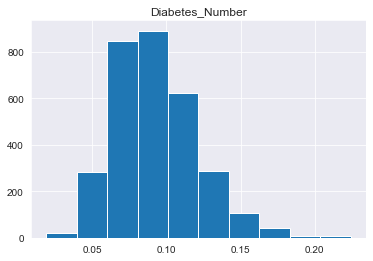

In [92]:
#Generate a histogram of overall diabetes rates
diabetes.hist("Diabetes_Number")

## Histogram of overall rates of diabetes
The histogram confirms much of the information we gleaned from the measures of central tendency. We see that not many counties have rates of diabetes beyond 15%. However, these counties may be among those that would benefit the most from a policy intervention aimed at reducing diabetes. Let's see if a box plot can give us more information.

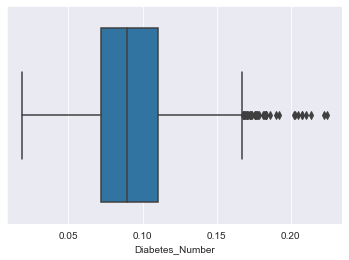

In [93]:
sns.boxplot(x=diabetes['Diabetes_Number'])

## Box and whisker plot of overall diabetes rates
The boxplot reiterates much of the same information provided in the historgram. However, we notice that there are numerous outliers (much more than the previously stated few) that span beyond the upper quartile/whisker of the plot. This cut off might provide a good mark to identify potential candidates for an intervention. These outliers can be easily identified by asking Python to list counties whose Diabetes_Number is beyond the values associated with the third quartile plus 1.5 times the interquartile range (q3 + (1.5 * IQR). Consequently, we will calculate these ranges and then ask Python to identify these counties according to this cut off.

In [94]:
#Let's begin by calculating our quartiles.
q1= diabetes.quantile(0.25)
q3= diabetes.quantile(0.75)
#Now we will calculate the interquartile range
IQR= q3 - q1
#Finally, we will create a value called 'outlier' that will give us our outlier cut off.
outlier= q3 + (1.5 * IQR)
print(IQR)


Diabetes_Number                                                                                                                                             0.038006
Obesity_Number                                                                                                                                              0.056677
Physical_Inactivity_Number                                                                                                                                  0.060912
sex and age_total population_65 years and over_sex ratio (males per 100 females)                                                                           10.100000
race_total population                                                                                                                                   57250.500000
race_total population_one race                                                                                                                              0.015592
race_total

In [95]:
#Now let's print outlier to see where our cut off is.
print(outlier)

Diabetes_Number                                                                                                                                              0.167185
Obesity_Number                                                                                                                                               0.365127
Physical_Inactivity_Number                                                                                                                                   0.322409
sex and age_total population_65 years and over_sex ratio (males per 100 females)                                                                           103.550000
race_total population                                                                                                                                   154353.000000
race_total population_one race                                                                                                                               1.010019
race

In [96]:
#For Diabetes_Number, we see that outlier counties are those that have rates at or above approximately 16.7%. Therefore
#we will use this number to tell python how to identify these counties.
diabetes.County[diabetes['Diabetes_Number'] >= .167185]

5             Bullock County
12             Clarke County
17            Conecuh County
18              Coosa County
39           Lawrence County
49             Monroe County
66            Winston County
144           Jackson County
184          Woodruff County
340            Glades County
427              Dade County
432             Dooly County
456           Hancock County
469           Johnson County
470             Jones County
472            Lanier County
506          Randolph County
515            Sumter County
516            Talbot County
520           Telfair County
542            Wilcox County
545             Worth County
912               Elk County
1126        Claiborne Parish
1410          Choctaw County
1462            Scott County
1467        Sunflower County
1470           Tippah County
1477            Wayne County
1897           Bertie County
1898           Bladen County
1931          Halifax County
1935         Hertford County
1941            Jones County
1955      Nort

In [97]:
#This is quite a long list, so now let's count how many counties exceed our cut off.
diabetes.County[diabetes['Diabetes_Number'] >= .167185].count()

45

In [98]:
#Now that we know we have 45 counties that have particularly high rates of diabetes, let's see in which states
#these counties are located.
diabetes.State[diabetes['Diabetes_Number'] >= .167185].unique()

array(['Alabama', 'Arkansas', 'Florida', 'Georgia', 'Kansas', 'Louisiana',
       'Mississippi', 'North Carolina', 'Oklahoma', 'South Carolina',
       'Texas', 'Utah', 'Virginia'], dtype=object)

In [99]:
diabetes.State[diabetes['Diabetes_Number'] >= .167185]

5              Alabama
12             Alabama
17             Alabama
18             Alabama
39             Alabama
49             Alabama
66             Alabama
144           Arkansas
184           Arkansas
340            Florida
427            Georgia
432            Georgia
456            Georgia
469            Georgia
470            Georgia
472            Georgia
506            Georgia
515            Georgia
516            Georgia
520            Georgia
542            Georgia
545            Georgia
912             Kansas
1126         Louisiana
1410       Mississippi
1462       Mississippi
1467       Mississippi
1470       Mississippi
1477       Mississippi
1897    North Carolina
1898    North Carolina
1931    North Carolina
1935    North Carolina
1941    North Carolina
1955    North Carolina
1966    North Carolina
2183          Oklahoma
2189          Oklahoma
2396    South Carolina
2438    South Carolina
2755             Texas
2803             Texas
2828             Texas
2859       

### Summary
Based on our explorations thus far, we see that 45 counties have rates of diabetes that are exceptionally high compared to country-wide averages. Of these 45 counties, 42 of them are located in southern states. This suggests that policy interventions may yield the greatest impact if targeted to the South. However, now I wonder what rates of diabetes look like across the south. The counties we isolated are among the most extreme values. However, might we also see generally elevated rates of diabetes in the south? Instead of listing out counties and states by a cut off, let's create a choropleth map that gives us a bird's eye view of diabetes rates throughout the country. This way, we can see if elevated rates of diabetes are isolated to these extreme counties in the South or if the South might more generally report higher rates of diabetes compared to other geographic regions in the country. 

In [100]:
pip install plotly #I didn't run this here since I already downloaded it when I was playing around in my other copy of this notebook.

Note: you may need to restart the kernel to use updated packages.


In [101]:
#Choropleth Map. This code was sourced from https://plotly.com/python/choropleth-maps/.

from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import plotly.express as px

fig = px.choropleth(diabetes, geojson=counties, locations='CountyFIPS', color='Diabetes_Number',
                           color_continuous_scale="Viridis",
                           range_color=(0.00, 0.20), #range was selected using min and max derived from measures of CT. I slightly low-balled the upper range so we can see the contrast better.
                           scope="usa",
                           labels={'Diabetes_Number':'Proportion of Population with Diabetes'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### What does this map tell us?
Confirming our suspicion, this maps shows that the counties in the South show elevated rates of diabetes. This might suggest that a policy intervention intended to lower the rate of diabetes might have the greatest impact in the South more broadly. Resources permitting, a broader intervention targeting the southern states could yield tremendous benefit beyond the initially identified 45 counties.

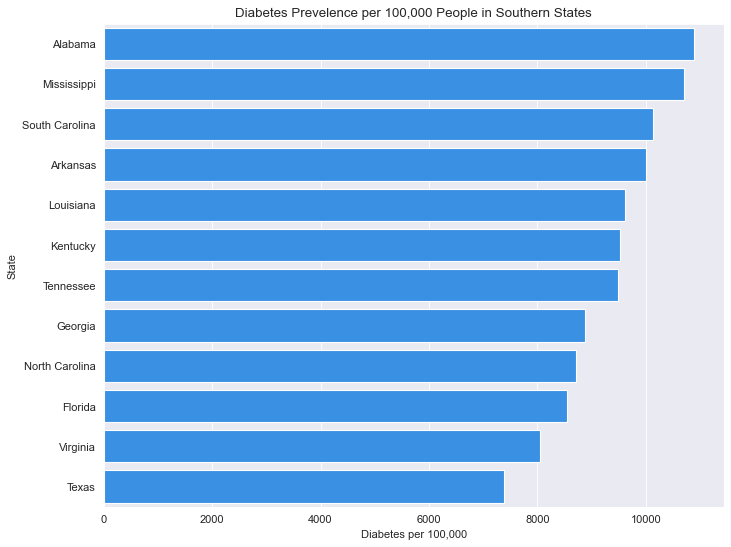

In [102]:
#Let's create a bar chart that displays the rates of diabetes across southern states.

#We'll start by creating a list of the southern states
southern_states = ['Mississippi', 'Alabama', 'Georgia', 'South Carolina', 
          'Louisiana', 'Tennessee', 'North Carolina',
         'Arkansas', 'Florida', 'Virginia', 'Texas', 'Kentucky']

#Then, we'll follow these steps to generate our chart:
    #create a subset of rows that just correspond to southern states
    #create new column: total number of people per county with diabetes
    #group by state
    #create 2 new columns: sum of people with diabetes & sum of total population (both grouped by state)
    #calculate disease prevalence per 100,00 (for interpretability)
    #make sure bars are displayed in descending order
diabetes_aggregated = diabetes.loc[diabetes.State.isin(southern_states),:].assign(pop_with_diabetes=diabetes.Diabetes_Number * diabetes['race_total population']).groupby(by='State', as_index=False).agg({'pop_with_diabetes':np.sum, 'race_total population':np.sum})
diabetes_aggregated['diabetes_per_100000'] = (diabetes_aggregated['pop_with_diabetes']/diabetes_aggregated['race_total population']) *100_000
diabetes_aggregated['State'] = pd.Categorical(diabetes_aggregated.State,
                                              diabetes_aggregated.sort_values('diabetes_per_100000',ascending=False).State.tolist(), 
                                              ordered=True)
#Scale the chart
plt.figure(figsize=(10,8), dpi=80)

#Create and format the chart
g = sns.barplot(x='diabetes_per_100000', y='State', data=diabetes_aggregated, color='dodgerblue')
plt.xlabel('Diabetes per 100,000')
plt.title('Diabetes Prevelence per 100,000 People in Southern States');

## What can we learn from this bar chart?
Within the subset of southern states, we can now easily see which states have the highest diabetes prevalence: Alabama, Mississippi, and South Carolina constitute the three states with the highest rate of this chronic illness. Thus, they might present the greatest opportunity for a policy intervention.

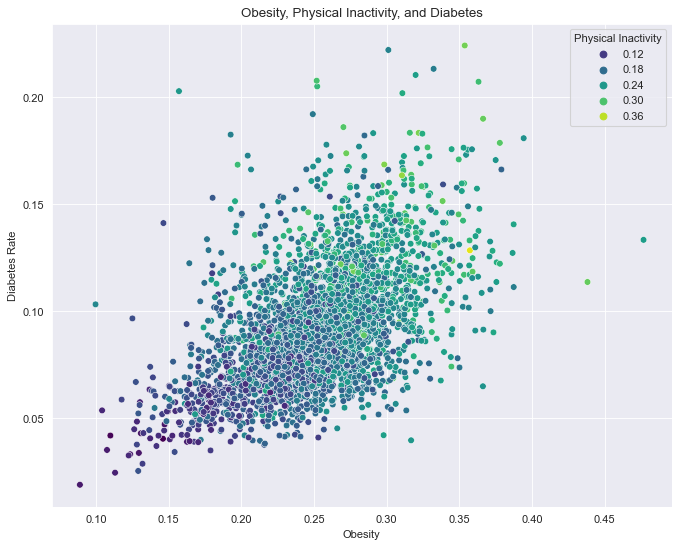

In [103]:
#Now, let's create a scatterplot to understand the potential relationships between the following variables:
#obesity, physical inactivity, and diabetes.

#Scale the graph 
plt.figure(figsize=(10,8), dpi=80)

#Create the scatterplot
sns.scatterplot(x='Obesity_Number', y='Diabetes_Number',hue='Physical_Inactivity_Number',data=diabetes, palette='viridis')

#Create title and axis labels
plt.xlabel('Obesity')
plt.ylabel('Diabetes Rate')
plt.legend(title='Physical Inactivity')
plt.title('Obesity, Physical Inactivity, and Diabetes');

## Summary
As we suspected based on our pre-existing knowledge of the current diabetes literature, there appears to be a strong positive correlation between obsesity and diabetes in our data. When adding a third dimension to our scatterplot, physical inactivity, we are able to see taht lower diabetes rates are associated both with lower obesity and lower physical inactivity (and the converse appears true, as well: higher diabetes rates appear to be associated with both higher obesity and higher physical inactvity rates). 

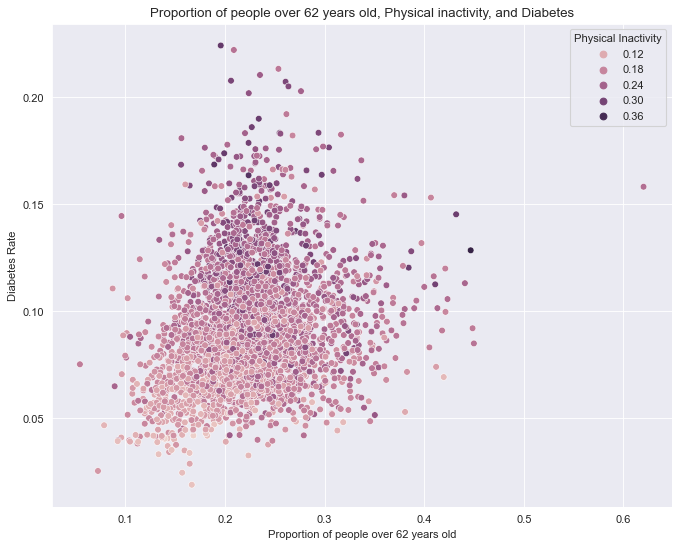

In [104]:
# Age and race could also be predictors for diabetes, but we don't know the breakdown of Diabetes_Number by race or age, 
    # We only know the proportion of each ethnicity or age group within each county. 
# Alternatively, we can look at if there is a relationship between Diabetes_Number and the proportion of people 
   # over 62 years old across counties, and potentially, their association with Physical_Inactivity_Number

# Scale the graph 
plt.figure(figsize=(10,8), dpi=80)

# Create the scatterplot
sns.scatterplot(x='sex and age_total population_62 years and over', y='Diabetes_Number', hue='Physical_Inactivity_Number', data=diabetes, palette= None)

# Create title and axis labels
plt.xlabel('Proportion of people over 62 years old')
plt.ylabel('Diabetes Rate')
plt.legend(title='Physical Inactivity')
plt.title('Proportion of people over 62 years old, Physical inactivity, and Diabetes');

## What can we learn from the above scatterplot?
There is a rough trend that as the proportion of people over 62 years old increases, the degree of physical inactivity and the number of diabetes increase as well. 


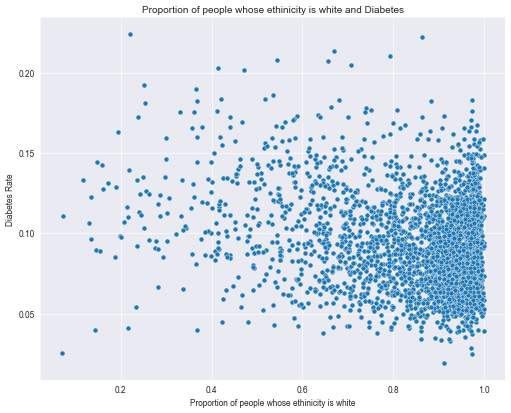

In [105]:
# Similarly, we can look at if there is a relationship between Diabetes_Number and the proportion of people 
   # who are identified as white, as in most counties white people are the majority.

# Scale the graph 
plt.figure(figsize=(10,8), dpi=60)

# Create the scatterplot
sns.scatterplot(x='race alone or in combination with one or more other races_total population_white', y='Diabetes_Number',data=diabetes, palette= None)

# Create title and axis labels
plt.xlabel('Proportion of people whose ethinicity is white')
plt.ylabel('Diabetes Rate')
plt.title('Proportion of people whose ethinicity is white and Diabetes');

## What can we learn from the above scatterplot?
In line with a glance of the raw data, in most counties white people are the majority of the population. From the graph there is no obvious association between the proportion of white people over the population and the number of diabetes.

## Potential additions to EDA
* Do we want to show bar charts that highlight the rates of diabetes across southern states?
* Can we create scatter plots showing the relationships between diabetes, obesity, and/or exercise rates?
* Similarly, might we use python to tell us correlations between these rates?

## 3. Prepare to Fit Models

### 3.1 Finalize Data Set

We've already cleaned up the data, but we can make a few more adjustments before partitioning the data and training models. Let's recode 'State' to be a categorical variable using `pd.get_dummies` and drop 'County' using `.drop()` because 'CountyFIPS' is already a unique identifier for the county. 

In [106]:
# create dummy features out of 'State' , which might be related to diabetes rates 
diabetes_clean = pd.get_dummies(diabetes, 
                               columns = ['State'],  
                               drop_first = True) # only create 49 dummies by dropping first in category

# drop 'County' variable
diabetes_clean = diabetes_clean.drop(labels = ['County'],
                               axis = 1) # which axis tells python we want to drop columns rather than index rows?

# look at first 10 rows of new data frame 
diabetes_clean.head(10) 

,CountyFIPS,Diabetes_Number,Obesity_Number,Physical_Inactivity_Number,sex and age_total population_65 years and over_sex ratio (males per 100 females),race_total population,race_total population_one race,race_total population_two or more races,race_total population_one race_white,race_total population_one race_black or african american,race_total population_one race_american indian and alaska native,race_total population_one race_american indian and alaska native_cherokee tribal grouping,race_total population_one race_american indian and alaska native_chippewa tribal grouping,race_total population_one race_american indian and alaska native_navajo tribal grouping,race_total population_one race_american indian and alaska native_sioux tribal grouping,race_total population_one race_asian,race_total population_one race_asian_asian indian,race_total population_one race_asian_chinese,race_total population_one race_asian_filipino,race_total population_one race_asian_japanese,race_total population_one race_asian_korean,race_total population_one race_asian_vietnamese,race_total population_one race_asian_other asian,race_total population_one race_native hawaiian and other pacific islander,race_total population_one race_native hawaiian and other pacific islander_native hawaiian,race_total population_one race_native hawaiian and other pacific islander_guamanian or chamorro,race_total population_one race_native hawaiian and other pacific islander_samoan,race_total population_one race_native hawaiian and other pacific islander_other pacific islander,race_total population_one race_some other race,race_total population_two or more races_white and black or african american,race_total population_two or more races_white and american indian and alaska native,race_total population_two or more races_white and asian,race_total population_two or more races_black or african american and american indian and alaska native,race alone or in combination with one or more other races_total population,race alone or in combination with one or more other races_total population_white,race alone or in combination with one or more other races_total population_black or african american,race alone or in combination with one or more other races_total population_american indian and alaska native,race alone or in combination with one or more other races_total population_asian,race alone or in combination with one or more other races_total population_native hawaiian and other pacific islander,race alone or in combination with one or more other races_total population_some other race,hispanic or latino and race_total population_hispanic or latino (of any race),hispanic or latino and race_total population_hispanic or latino (of any race)_mexican,hispanic or latino and race_total population_hispanic or latino (of any race)_puerto rican,hispanic or latino and race_total population_hispanic or latino (of any race)_cuban,hispanic or latino and race_total population_hispanic or latino (of any race)_other hispanic or latino,hispanic or latino and race_total population_not hispanic or latino,hispanic or latino and race_total population_not hispanic or latino_white alone,hispanic or latino and race_total population_not hispanic or latino_black or african american alone,hispanic or latino and race_total population_not hispanic or latino_american indian and alaska native alone,hispanic or latino and race_total population_not hispanic or latino_asian alone,hispanic or latino and race_total population_not hispanic or latino_native hawaiian and other pacific islander alone,hispanic or latino and race_total population_not hispanic or latino_some other race alone,hispanic or latino and race_total population_not hispanic or latino_two or more races,hispanic or latino and race_total population_not hispanic or latino_two or more races_two races including some other race,hispanic or latino and race_total population_not hispanic or latino_two or more races_two races excluding some other race -

### 3.2/3.3 Partition Data and Feature Selection

Now, we will partition our data to prepare it for the training process. We will use 60% train—20% validation—20% test in this case. More data in the training set lowers bias, but then increases variance in the validation/test sets. Balancing between bias and variance with choice of these set sizes is important as we want to ensure that there is enough data to train on to get good predictions, but also want to make sure our hold-out sets are representative enough.

In [107]:
from sklearn.model_selection import train_test_split

# Set y 
y = diabetes_clean['Diabetes_Number']

# X (everything except diabetes, our target)
X = diabetes_clean.drop(['Diabetes_Number'], axis=1)

We should also preprocess our data. Using the `preprocessing` module from sklearn, let's scale our features so that they are mean-centered.

In [108]:
from sklearn import preprocessing

X = preprocessing.scale(X)

We can also get rid of the 0 variance features using the `VarianceThreshold()` method from `feature_selection`. 

In [109]:
from sklearn import feature_selection

selector = feature_selection.VarianceThreshold(0)
X = selector.fit_transform(X)

And finally, let's split our data:

In [110]:
# split the data
# train_test_split returns 4 values: X_train, X_test, y_train, y_test, so how do we create a 60-20-20 train-validate-test split? 

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                   train_size=0.8, test_size=0.2)

X_train, X_validate, y_train, y_validate = train_test_split(X_train, y_train,
                                                           train_size=0.75, test_size=0.25)

In [111]:
#Check the shape of training, validation, and test data sets
print("Shape of X_train is", X_train.shape)
print("Shape of y_train is", y_train.shape)
print("Shape of X_validate is", X_validate.shape)
print("Shape of y_validate is", y_validate.shape)
print("Shape of X_test is", X_test.shape)
print("Shape of y_test is", y_test.shape)

Shape of X_train is (1866, 135)
Shape of y_train is (1866,)
Shape of X_validate is (623, 135)
Shape of y_validate is (623,)
Shape of X_test is (623, 135)
Shape of y_test is (623,)


## 4. Train Models
In this section, we will train the following three models: OLS, Ridge, and LASSO, using the training set. Then we will tune hyperparameters for each model also in the training set, and then get 3 models with their best set of hyperparameters respectively. 

### 4.1 Linear Regression (Ordinary Least Squares) 

In [112]:
# first, we need to create the model
lin_reg = LinearRegression(normalize=True)

# then, we need to fit the model
lin_model = lin_reg.fit(X_train, y_train)
lin_reg_data = pd.DataFrame([lin_model.coef_, 
                             diabetes_clean.drop(columns=['Diabetes_Number']).columns]).T
lin_reg_data.columns = ['Coefficient', 'Feature']
lin_reg_data.replace(to_replace=[None], value= 0, inplace=True)

In [113]:
def rmse(pred, actual):
    return np.sqrt(np.mean((pred - actual) ** 2))


In [114]:
# use CV to tune the hyperparameters for the OLS model


param_grid = {'fit_intercept': ['True', 'False'],
              'normalize': ['True', 'False']}

# Grid search (for hyperparameter)
lin_grid_reg = GridSearchCV(lin_reg, param_grid, cv=3)

# Fit model on training data
lin_grid_reg.fit(X_train, y_train)

# Get best model by mean test score
best_index = np.argmax(lin_grid_reg.cv_results_["mean_test_score"])
# Get best predictions by predicting on validation set
best_lin_pred = lin_grid_reg.best_estimator_.predict(X_validate)

# Print the best parameters, CV r2, validation r2, and validation RMSE
print(lin_grid_reg.cv_results_["params"][best_index])
print('Best CV R^2:', max(lin_grid_reg.cv_results_["mean_test_score"]))
print('Validation R^2:', lin_grid_reg.score(X_validate, y_validate))
print('Validation RMSE', rmse(best_lin_pred, y_validate))

{'fit_intercept': 'True', 'normalize': 'True'}
Best CV R^2: -4.2406304181355946e+57
Validation R^2: 0.46300496011207337
Validation RMSE 0.020342191165860012


### 4.2 Ridge Regression 

In [115]:
# first, we need to initialize and fit a Ridge regression model
ridge_reg = Ridge() 
ridge_model = ridge_reg.fit(X_train, y_train)
ridge_reg_data = pd.DataFrame([ridge_model.coef_, 
                              diabetes_clean.drop(columns = ['Diabetes_Number']).columns]).T 
ridge_reg_data.columns = ['Coefficient', 'Feature']
ridge_reg_data.replace(to_replace=[None], value= 0, inplace=True)
ridge_reg_data['Coefficient'] = ridge_reg_data['Coefficient'].astype(float) 

In [116]:
# use CV to tune the hyperparameters for the RIDGE model 

param_grid = {'alpha': np.arange(.1, 1, .1),
              'normalize': ['True', 'False'],
              'fit_intercept': ['True', 'False'],
              'solver': ['auto', 'svd', 'cholesky', 'lsqr']}
# Grid search
ridge_grid_reg = GridSearchCV(ridge_reg, param_grid, cv=3)

# Fit model on training data
ridge_grid_reg.fit(X_train, y_train)

# Get best model by mean test score
best_index = np.argmax(ridge_grid_reg.cv_results_["mean_test_score"])

# Get best predictions by predicting on validation set
best_ridge_pred = ridge_grid_reg.best_estimator_.predict(X_validate)

# Print the best parameters, CV r2, validation r2, and validation RMSE
print(ridge_grid_reg.cv_results_["params"][best_index])
print('Best CV R^2:', max(ridge_grid_reg.cv_results_["mean_test_score"]))
print('Validation R^2:', ridge_grid_reg.score(X_validate, y_validate))
print('Validation RMSE', rmse(best_ridge_pred, y_validate))

{'alpha': 0.9, 'fit_intercept': 'True', 'normalize': 'True', 'solver': 'svd'}
Best CV R^2: -42.19604340510859
Validation R^2: 0.4981714376554003
Validation RMSE 0.019664833891147104


### 4.3 LASSO Regression 

In [117]:
# for our last model, LASSO, we will begin by creating and fitting the model
lasso_reg = Lasso(max_iter=1000)  

lasso_model = lasso_reg.fit(X_train, y_train)
lasso_reg_data = pd.DataFrame([lasso_model.coef_, 
                               diabetes_clean.drop(columns = ['Diabetes_Number']).columns]).T 
lasso_reg_data.columns = ['Coefficient', 'Feature']
lasso_reg_data.replace(to_replace=[None], value= 0, inplace=True)
lasso_reg_data['Coefficient'] = lasso_reg_data['Coefficient'].astype(float) 

In [118]:
# use CV to tune the hyperparameters for the LASSO model

param_grid = {'alpha': np.arange(.1, 1, .1),
              'normalize': ['True', 'False'],
              'fit_intercept': ['True', 'False'],
              'selection': ['cyclic', 'random']}

# Grid search
lasso_grid_reg = GridSearchCV(lasso_reg, param_grid, cv=3)

# Fit model on training data
lasso_grid_reg.fit(X_train, y_train)

# Get best model by mean test score
best_index = np.argmax(lasso_grid_reg.cv_results_["mean_test_score"])

# Get best predictions by predicting on validation set
best_lasso_pred = lasso_grid_reg.best_estimator_.predict(X_validate)

# Print the best parameters, CV r2, validation r2, and validation RMSE
print(lasso_grid_reg.cv_results_["params"][best_index])
print('Best CV R^2:', max(lasso_grid_reg.cv_results_["mean_test_score"]))
print('Validation R^2:', lasso_grid_reg.score(X_validate, y_validate))
print('Validation RMSE', rmse(best_lasso_pred, y_validate))

{'alpha': 0.1, 'fit_intercept': 'True', 'normalize': 'True', 'selection': 'cyclic'}
Best CV R^2: -0.0014479879063390804
Validation R^2: -0.0004956340499586709
Validation RMSE 0.027766439466639033


<font color='red'>@Team, when I run this next code block, I see all points appearing on the line y=0.093.</font>
<font color='red'>Any ideas for resolving this? - Rachel</font>

<font color= 'blue'>Hi--I got the same thing so I ran the coefficient visualization below for just the LASSO coefficients and it appears that, as we suspected, that LASSO is dragging all of our features to zero. I know this is what LASSO does but I don't understand why it is not letting a single feature through as a predictor. I tried to do some googling/stack overflow searching on this but didn't find anything. It might have something to do with the number of variables we have in the dataframe (we have a lot more than the example we used in lab), but I'm not sure. We should ask KQ about this. -Anthony </font>

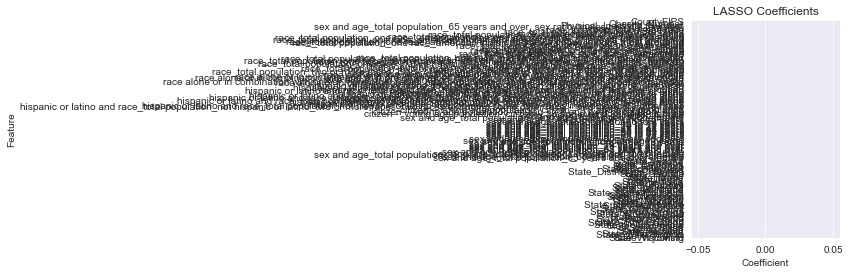

In [119]:
#Added in the coefficient visualization just for LASSO to get a better idea
#of what might be going on.
figure = plt.figure()
figure.subplots_adjust(wspace = .25, hspace= .25)
figure.add_subplot(1, 2, 1)
# Plot for Ridge coefficients here
#sns.barplot(x="Coefficient", y="Feature", data=ridge_reg_data).set_title("Ridge Coefficients")
#figure.add_subplot(1, 2, 2)
# Plot for Lasso coefficients here
sns.barplot(x="Coefficient", y="Feature", data=lasso_reg_data).set_title("LASSO Coefficients")
plt.show()

<font color= 'green'> Detail the basic logic and assumptions underlying each model,its pros/cons, and why it is a plausible choice for this problem.</font>

## 5. Validate and Refine Models
In this section, we will: 
5.1 Use the 3 models to predict in the validation set, choose the best one (the lowest rmse).
5.2 Do feature selection manually by eyeballing the plot, get a new set of reduced features.
5.3 Retrain the model with reduced features in the training set, use grid search as well to tune hyperparameters, and predict in the test set. 
5.4 Use the feature-reduced model with the best set of hyperparameters to fit the full data, use grid search (cross validation) as well. 

<font color= 'blue'> So I ran the code that we used in lab on our models and as you'll see, our results are really wonky. The CV R^2s are negative, which makes no sense. My only suspicion is that this might be indicative of overspecification/overfitting (I know in normal regression with Stata that a negative R^2 is usually indicative of overspecification). In this case, do we need to select the specific features that go into the model? If so, how do we go about doing this?  I don't think we covered it in class. Interestingly enough the validation R^2s look fairly normal, except for LASSO which is incredibly small (this would be consistent with our coefficient chart above that shows all the features shrunk to 0). All this said, I could very well be misspecifying our hyperparameters. That part of lab did not make much sense to me so I could be at fault. I tried messing around with the number of cross validations (setting the cv to 5 and 10) but I still got some pretty weird CV R2s. -Anthony </font>

### 5.1 Use the three models to predict in the validation set, choose the best one (the lowest rmse).

In [120]:
# use X_validation and y_validation data sets to evaluate and refine your models

In [121]:
# Use the tuned OLS model to predict in the validation set 

lin_pred = lin_grid_reg.best_estimator_.predict(X_validate)
print('validation CV R^2:', max(lin_grid_reg.cv_results_["mean_test_score"]))
print('validation R^2:', lin_grid_reg.score(X_validate, y_validate))
print('validation RMSE', rmse(lin_pred, y_validate))

validation CV R^2: -4.2406304181355946e+57
validation R^2: 0.46300496011207337
validation RMSE 0.020342191165860012


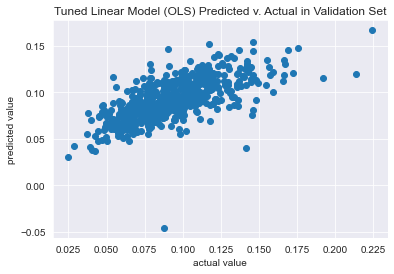

In [122]:
# Look at the difference between the predicted values and the actual values, also called the error, in validation set
# plot the residuals on a scatter plot
plt.scatter(y_validate, lin_pred)
plt.title('Tuned Linear Model (OLS) Predicted v. Actual in Validation Set')
plt.xlabel('actual value')
plt.ylabel('predicted value')
plt.show()

In [123]:
# Use the tuned RIDGE model to predict in the validation set 

ridge_pred = ridge_grid_reg.best_estimator_.predict(X_validate)
print('validation CV R^2:', max(ridge_grid_reg.cv_results_["mean_test_score"]))
print('validation R^2:', ridge_grid_reg.score(X_validate, y_validate))
print('validation RMSE', rmse(ridge_pred, y_validate))

validation CV R^2: -42.19604340510859
validation R^2: 0.4981714376554003
validation RMSE 0.019664833891147104


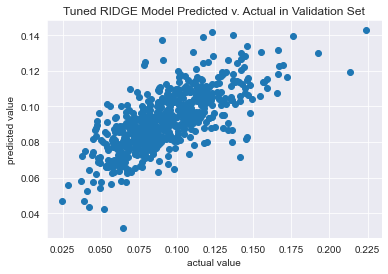

In [124]:
# again, plot the residuals/error on a scatter plot
plt.scatter(y_validate, ridge_pred)
plt.title('Tuned RIDGE Model Predicted v. Actual in Validation Set')
plt.xlabel('actual value')
plt.ylabel('predicted value')
plt.show()

In [125]:
# Use the tuned LASSO model to predict in the validation set 

lasso_pred = lasso_grid_reg.best_estimator_.predict(X_validate)
print('validation CV R^2:', max(lasso_grid_reg.cv_results_["mean_test_score"]))
print('validation R^2:', lasso_grid_reg.score(X_validate, y_validate))
print('validation RMSE', rmse(lasso_pred, y_validate))

validation CV R^2: -0.0014479879063390804
validation R^2: -0.0004956340499586709
validation RMSE 0.027766439466639033


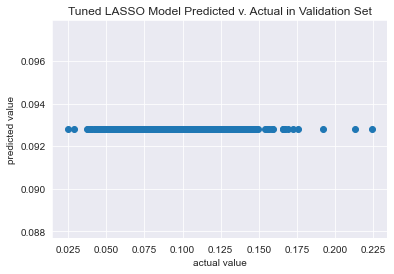

In [126]:
# again, plot the residuals/error on a scatter plot
plt.scatter(y_validate, lasso_pred)
plt.title('Tuned LASSO Model Predicted v. Actual in Validation Set')
plt.xlabel('actual value')
plt.ylabel('predicted value')
plt.show()

The best model so far with the lowest rmse is the tuned RIDGE model. 

<font color= 'blue'> I think something might be off with the test set RMSE because it is the exact same as the test RMSE and in the lab they were slightly different. -Anthony </font>

### 5.2 Do feature selection manually by eyeballing the plot, get a new set of reduced features. 

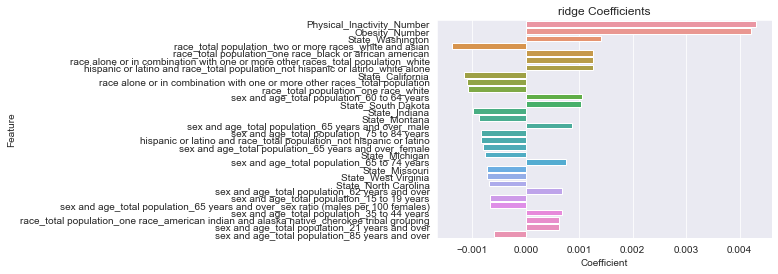

In [127]:
# We will do feature selection using the RIDGE model with tuned hyperparameters

# visualize the coefficients

## create a dataframe with coefficients and feature names
ridge_reg_data = pd.DataFrame([ridge_grid_reg.best_estimator_.coef_, 
                             diabetes_clean.drop(columns=['Diabetes_Number']).columns]).T


ridge_reg_data.columns = ['Coefficient', 'Feature']
ridge_reg_data.replace(to_replace=[None], value= 0, inplace=True)
ridge_reg_data['Coefficient'] = ridge_reg_data['Coefficient'].astype(float)

## to save the absolute value of coefficients
ridge_reg_data['Coefficient_abs'] = abs(ridge_reg_data['Coefficient']) 

## Plot
ax = sns.barplot(x="Coefficient", y="Feature", data=ridge_reg_data.nlargest(30, "Coefficient_abs"))
ax.set_title("ridge Coefficients")
plt.show()

 It seems that most features falling in the second half of the plot are within [-0.001, 0.001], which are pretty small. To prevent overfitting, let's try using the top 20 features in the plot. 

In [128]:
top20_features_ridge_tuned = list(ridge_reg_data.nlargest(20, 'Coefficient_abs')['Feature'])
top20_features_ridge_tuned

['Physical_Inactivity_Number',
 'Obesity_Number',
 'State_Washington',
 'race_total population_two or more races_white and asian',
 'race_total population_one race_black or african american',
 'race alone or in combination with one or more other races_total population_white',
 'hispanic or latino and race_total population_not hispanic or latino_white alone',
 'State_California',
 'race alone or in combination with one or more other races_total population',
 'race_total population_one race_white',
 'sex and age_total population_60 to 64 years',
 'State_South Dakota',
 'State_Indiana',
 'State_Montana',
 'sex and age_total population_65 years and over_male',
 'sex and age_total population_75 to 84 years',
 'hispanic or latino and race_total population_not hispanic or latino',
 'sex and age_total population_65 years and over_female',
 'State_Michigan',
 'sex and age_total population_65 to 74 years']

### 5.3 Retrain the model with reduced features in the training set, use grid search as well to tune hyperparameters, and predict in the test set.

<font color= 'green'> What is the advantage of using both validation and test sets in the social sciences and public policy?</font>

In [156]:
# set up X_train, X_validate, and X_test with selected features (y can be the same 'Diabetes_Number')

# first we need to attach column names back to X_train and X_test, where some columns should have been dropped from diabetes_clean: 'Diabetes_Number' and the one(s) with 0 variance 
# create an index for column names
names = diabetes_clean.drop(columns = ['Diabetes_Number']).loc[:, selector.get_support()].columns
# then attach column names to X_train and X_test
X_train = pd.DataFrame(X_train)
X_validate = pd.DataFrame(X_validate)
X_test = pd.DataFrame(X_test)
X_train.columns = names
X_validate.columns = names
X_test.columns = names
# then create a subset of X_train and X_test with selected features 
X_train_20features = X_train[['Physical_Inactivity_Number',
                              'Obesity_Number',
                              'State_Washington',
                              'race_total population_two or more races_white and asian',
                              'race_total population_one race_black or african american',
                              'race alone or in combination with one or more other races_total population_white',
                              'hispanic or latino and race_total population_not hispanic or latino_white alone',
                              'State_California',
                              
                              'race_total population_one race_white',
                              'sex and age_total population_60 to 64 years',
                              'State_South Dakota',
                              'State_Indiana',
                              'State_Montana',
                              'sex and age_total population_65 years and over_male',
                              'sex and age_total population_75 to 84 years',
                              'hispanic or latino and race_total population_not hispanic or latino',
                              'sex and age_total population_65 years and over_female',
                              'State_Michigan',
                              'sex and age_total population_65 to 74 years']]

# KeyError: "['race alone or in combination with one or more other races_total population'] not in index"
# One feature in the top20features is not showing in the X_train set. Very strange. 
# I manually deleted this feature, now we only have 19 features in the reduced model. -Luyi 


X_validate_20features = X_validate[['Physical_Inactivity_Number',
                              'Obesity_Number',
                              'State_Washington',
                              'race_total population_two or more races_white and asian',
                              'race_total population_one race_black or african american',
                              'race alone or in combination with one or more other races_total population_white',
                              'hispanic or latino and race_total population_not hispanic or latino_white alone',
                              'State_California',
                              
                              'race_total population_one race_white',
                              'sex and age_total population_60 to 64 years',
                              'State_South Dakota',
                              'State_Indiana',
                              'State_Montana',
                              'sex and age_total population_65 years and over_male',
                              'sex and age_total population_75 to 84 years',
                              'hispanic or latino and race_total population_not hispanic or latino',
                              'sex and age_total population_65 years and over_female',
                              'State_Michigan',
                              'sex and age_total population_65 to 74 years']]

# Got the same error message, so I deleted this feature again -Luyi  

X_test_20features = X_test[['Physical_Inactivity_Number',
                              'Obesity_Number',
                              'State_Washington',
                              'race_total population_two or more races_white and asian',
                              'race_total population_one race_black or african american',
                              'race alone or in combination with one or more other races_total population_white',
                              'hispanic or latino and race_total population_not hispanic or latino_white alone',
                              'State_California',
                              
                              'race_total population_one race_white',
                              'sex and age_total population_60 to 64 years',
                              'State_South Dakota',
                              'State_Indiana',
                              'State_Montana',
                              'sex and age_total population_65 years and over_male',
                              'sex and age_total population_75 to 84 years',
                              'hispanic or latino and race_total population_not hispanic or latino',
                              'sex and age_total population_65 years and over_female',
                              'State_Michigan',
                              'sex and age_total population_65 to 74 years']]

# Got the same error message, so I deleted this feature again -Luyi  

In [158]:
# retrain OLS model using reduced features 
lin_retrain = lin_reg.fit(X_train_20features, y_train)

# use CV to tune the hyperparameters for the OLS model with reduced features

param_grid = {'fit_intercept': ['True', 'False'],
              'normalize': ['True', 'False']}

# Grid search (for hyperparameter)
lin_grid_retrain = GridSearchCV(lin_reg, param_grid, cv=3)

# Fit model on training data
lin_grid_retrain.fit(X_train_20features, y_train)

# Get best model by mean test score
best_index = np.argmax(lin_grid_retrain.cv_results_["mean_test_score"])
# Get best predictions by predicting on validation set
best_lin_pred_retrain = lin_grid_retrain.best_estimator_.predict(X_validate_20features)

# Print the best parameters, CV r2, validation r2, and validation RMSE
print(lin_grid_retrain.cv_results_["params"][best_index])
print('Best CV R^2 by reduced features:', max(lin_grid_retrain.cv_results_["mean_test_score"]))
print('Validation R^2 by reduced features:', lin_grid_retrain.score(X_validate_20features, y_validate))
print('Validation RMSE by reduced features', rmse(best_lin_pred_retrain, y_validate))

{'fit_intercept': 'True', 'normalize': 'True'}
Best CV R^2 by reduced features: 0.48204084828916044
Validation R^2 by reduced features: 0.5058400476781936
Validation RMSE by reduced features 0.019514002998142425


In [159]:
# retrain ridge model using reduced features 
ridge_retrain = ridge_reg.fit(X_train_20features, y_train)

# use CV to tune the hyperparameters for the ridge model with reduced features

param_grid = {'alpha': np.arange(.1, 1, .1),
              'normalize': ['True', 'False'],
              'fit_intercept': ['True', 'False'],
              'solver': ['auto', 'svd', 'cholesky', 'lsqr']}

# Grid search (for hyperparameter)
ridge_grid_retrain = GridSearchCV(ridge_reg, param_grid, cv=3)

# Fit model on training data
ridge_grid_retrain.fit(X_train_20features, y_train)

# Get best model by mean test score
best_index = np.argmax(ridge_grid_retrain.cv_results_["mean_test_score"])
# Get best predictions by predicting on validation set
best_ridge_pred_retrain = ridge_grid_retrain.best_estimator_.predict(X_validate_20features)

# Print the best parameters, CV r2, validation r2, and validation RMSE
print(ridge_grid_retrain.cv_results_["params"][best_index])
print('Best CV R^2 by reduced features:', max(ridge_grid_retrain.cv_results_["mean_test_score"]))
print('Validation R^2 by reduced features:', ridge_grid_retrain.score(X_validate_20features, y_validate))
print('Validation RMSE by reduced features', rmse(best_ridge_pred_retrain, y_validate))

{'alpha': 0.1, 'fit_intercept': 'True', 'normalize': 'True', 'solver': 'auto'}
Best CV R^2 by reduced features: 0.47370295526876705
Validation R^2 by reduced features: 0.4945347274218589
Validation RMSE by reduced features 0.019735959977818938


In [160]:
# retrain lasso model using reduced features 
lasso_retrain = lasso_reg.fit(X_train_20features, y_train)

# use CV to tune the hyperparameters for the lasso model with reduced features

param_grid = {'alpha': np.arange(.1, 1, .1),
              'normalize': ['True', 'False'],
              'fit_intercept': ['True', 'False'],
              'selection': ['cyclic', 'random']}

# Grid search (for hyperparameter)
lasso_grid_retrain = GridSearchCV(lasso_reg, param_grid, cv=3)

# Fit model on training data
lasso_grid_retrain.fit(X_train_20features, y_train)

# Get best model by mean test score
best_index = np.argmax(lasso_grid_retrain.cv_results_["mean_test_score"])
# Get best predictions by predicting on validation set
best_lasso_pred_retrain = lasso_grid_retrain.best_estimator_.predict(X_validate_20features)

# Print the best parameters, CV r2, validation r2, and validation RMSE
print(lasso_grid_retrain.cv_results_["params"][best_index])
print('Best CV R^2 by reduced features:', max(lasso_grid_retrain.cv_results_["mean_test_score"]))
print('Validation R^2 by reduced features:', lasso_grid_retrain.score(X_validate_20features, y_validate))
print('Validation RMSE by reduced features', rmse(best_lasso_pred_retrain, y_validate))

{'alpha': 0.1, 'fit_intercept': 'True', 'normalize': 'True', 'selection': 'cyclic'}
Best CV R^2 by reduced features: -0.0014479879063390804
Validation R^2 by reduced features: -0.0004956340499586709
Validation RMSE by reduced features 0.027766439466639033


Using reduced features to retrain the model by three ML techniques, we see OLS model with reduced features and tuned hyperparameters performs best in predicting y in the validation set. Now we use this reduced-feature OLS model, full-feature OLS model, full-feature ridge model, and full-feature lasso model to predict in the test set, and choose the best-performed one. 

In [166]:
#  reduced-feature OLS model

OLS_reduced_pred = lin_grid_retrain.best_estimator_.predict(X_test_20features)
print('test CV R^2:', max(lin_grid_retrain.cv_results_["mean_test_score"]))
print('test R^2:', lin_grid_retrain.score(X_test_20features, y_test))
print('test RMSE', rmse(OLS_reduced_pred, y_test))

test CV R^2: 0.48204084828916044
test R^2: 0.46595680396827666
test RMSE 0.02034417716298416


In [162]:
# full-feature OLS model 

OLS_full_pred = lin_grid_reg.best_estimator_.predict(X_test)
print('test CV R^2:', max(lin_grid_reg.cv_results_["mean_test_score"]))
print('test R^2:', lin_grid_reg.score(X_test, y_test))
print('test RMSE', rmse(OLS_full_pred, y_test))

test CV R^2: -4.2406304181355946e+57
test R^2: 0.48583238395317285
test RMSE 0.01996201124645377


In [163]:
# full-feature ridge model 

ridge_full_pred = ridge_grid_reg.best_estimator_.predict(X_test)
print('test CV R^2:', max(ridge_grid_reg.cv_results_["mean_test_score"]))
print('test R^2:', ridge_grid_reg.score(X_test, y_test))
print('test RMSE', rmse(ridge_full_pred, y_test))

test CV R^2: -42.19604340510859
test R^2: 0.4685794585792382
test RMSE 0.020294161154429377


In [164]:
# full-feature lasso model 

lasso_full_pred = lasso_grid_reg.best_estimator_.predict(X_test)
print('test CV R^2:', max(lasso_grid_reg.cv_results_["mean_test_score"]))
print('test R^2:', lasso_grid_reg.score(X_test, y_test))
print('test RMSE', rmse(lasso_full_pred, y_test))

test CV R^2: -0.0014479879063390804
test R^2: -0.0010328237308134813
test RMSE 0.0278532639707872


Comparing 4 rmse (OLS, ridge, lasso, reduced-feature OLS model) in the test set, we see that the full-feature OLS model with tuned hyperparameter performs best (rmse = 0.01996). So we choose it as the preferred/final model for 5.4. 

Note: the rmse of the reduced-feature OLS model is very close to that of our preferred model. In practice we might want to choose the reduced-feature OLS model for better interpretability. 

### 5.4 Use the preferred model with the best set of hyperparameters to fit the full data, use grid search (cross validation) as well.

In [176]:
# reset the training and validation set with full data 
X_full_train, X_full_validate, y_full_train, y_full_validate = train_test_split(X, y, 
                                                   train_size=0.8, test_size=0.2)
X_full_train.shape
y_full_train.shape

#Check the shape
print("Shape of X_full_train is", X_full_train.shape)
print("Shape of y_full_train", y_full_train.shape)
print("Shape of X_full_validate is", X_full_validate.shape)
print("Shape of y_full_validate is", y_full_validate.shape)


Shape of X_full_train is (2489, 135)
Shape of y_full_train (2489,)
Shape of X_full_validate is (623, 135)
Shape of y_full_validate is (623,)


In [174]:
# fit the full-feature OLS model in the new training set 

lin_model = lin_reg.fit(X_full_train, y_full_train)
lin_reg_data = pd.DataFrame([lin_model.coef_, 
                             diabetes_clean.drop(columns=['Diabetes_Number']).columns]).T
lin_reg_data.columns = ['Coefficient', 'Feature']
lin_reg_data.replace(to_replace=[None], value= 0, inplace=True)

In [185]:
# use CV to tune the hyperparameters for the full-feature OLS model in the new validation set 


param_grid = {'fit_intercept': ['True', 'False'],
              'normalize': ['True', 'False']}

# Grid search (for hyperparameter)
lin_grid_reg = GridSearchCV(lin_reg, param_grid, cv=10)

# Fit model on training data
lin_grid_reg.fit(X_full_train, y_full_train)

# Get best model by mean test score
best_index = np.argmax(lin_grid_reg.cv_results_["mean_test_score"])
# Get best predictions by predicting on validation set
best_lin_pred = lin_grid_reg.best_estimator_.predict(X_full_validate)

# Print the best parameters, CV r2, validation r2, and validation RMSE
print(lin_grid_reg.cv_results_["params"][best_index])
print('CV R^2:', max(lin_grid_reg.cv_results_["mean_test_score"]))
print('Validation R^2:', lin_grid_reg.score(X_full_validate, y_full_validate))
print('Validation RMSE', rmse(best_lin_pred, y_full_validate))

{'fit_intercept': 'True', 'normalize': 'True'}
CV R^2: -1.874555118416504e+24
Validation R^2: 0.4596834306112476
Validation RMSE 0.01932190953057129


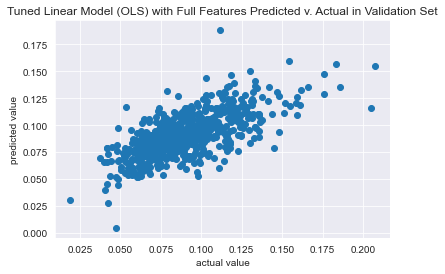

In [186]:
# Look at the difference between the predicted values and the actual values in the validation set
# plot the residuals on a scatter plot
plt.scatter(y_full_validate, best_lin_pred)
plt.title('Tuned Linear Model (OLS) with Full Features Predicted v. Actual in Validation Set')
plt.xlabel('actual value')
plt.ylabel('predicted value')
plt.show()

<font color= 'green'>Describe the tradeoffs involved with the choice of k.</font>
- It seems the choice of k does not influence the values of validation R^2 or rmse, but does impact the value of CV R^2, which fluctuates as k changes.
    
<font color= 'green'>Evaluate the results. How did cross-validation do compared to the train/validation/test split? </font>

- the full-feature OLS model with tuned hyperparameters generated from the cross-validation performs better (rmse = 0.0193 in validation set) than the train/validation/test split in prediction ( rmse = 0.0203 in in validation set and rmse = 0.01996 in test set).


## 6. Discussion Questions

### 6.1 What is the bias-variance trade-off? Why is it relevant to machine learning problems like this one?

### 6.2 Define overfitting, and why it matters for machine learning. How can we address it?

### 6.3 Analysis & Interpretation.